<a href="https://colab.research.google.com/github/cmnemoi/SpaceShip_Titanic/blob/main/Spaceship_Titanic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Compétition Kaggle Spaceship Titanic
## Enzo Risbetz et Charles-Meldhine Madi Mnemoi

Dans ce notebook nous présentons notre participation à la compétition Kaggle Spaceship Titanic.

L'objectif est de prédire quels passagers ont été transportés dans une autre dimension à partir de variables comme leur présence dans le module de cryostase, leur planète de départ, leur âge...



## Table des matières

Notre notebook abordera les points suivants (cliquer pour accéder aux sections correspondantes) :


*   Nettoyage des données
  * Valeurs manquantes
  * Valeurs aberrantes
*   Analyse exploratoire
* [Modélisation](https://colab.research.google.com/drive/1dy18-E9FKK6VdFFhVAI1A96AZ8Q8eGvb#scrollTo=YvRBClfGQ-Ic&line=1&uniqifier=1)
* Interprétation des résultats
* Mise en production

## Setup et import des librairies et des données

### Connection à l'API Kaggle et téléchargements des données

In [1]:
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json
!chmod 600 /root/.kaggle/kaggle.json

api_token = {"username":"cmmm976","key":"70d9e5ffb9a0ad1e87dd0d5027ce5310"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [2]:
!kaggle competitions download -c spaceship-titanic

spaceship-titanic.zip: Skipping, found more recently modified local copy (use --force to force download)


### Installation et import des libraries

In [3]:
!pip install pycaret markupsafe==2.0.1 pyyaml==5.4.1 scikit-learn==0.23.2 pandas-profiling==2.9.0 tune-sklearn ray[tune] -qq

In [4]:
import os, random, shutil

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic

from pycaret.classification import *

sns.set()

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [5]:
seed=0
def seed_everything(seed=0):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
seed_everything(seed)

### Import des données

In [6]:
shutil.unpack_archive("/content/spaceship-titanic.zip", "/content")

In [7]:
dataset = pd.read_csv("/content/train.csv", index_col="PassengerId")

## Nettoyage des données

### Dictionnaire des variables

In [ ]:
dataset.head()

,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
PassengerId,,,,,,,,,,,,,
0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [ ]:
dataset.shape

(8693, 13)

* `PassengerId` est un entier identifiant de manière unique un passager.
* `HomePlanet` est une chaîne de charactères indiquant la planète de départ du passager.
* `CryoSleep` est un booléen indiquant si le passager était en cryostase durant le voyage.
* `Cabin` est une chaîne de charactères indiquant la cabine du passager composé d'un `deck`, d'un `numéro` et  d'un côté (`side`).
* `Destination` est une chaîne de charactères indiquant la planète de destination du passager.
* `VIP` est un booléen indiquant si le passager a payé pour bénéficier d'un service VIP durant le voyage.
* `RoomService` est un flottant comptant le montant dépensé par le passager dans des services de chambre durant le voyage.
* `FoodCourt` est un flottant comptant le montant dépensé en nourriture par le passager.
* `ShoppingMall` est un flottant comptant le montant dépensé en achats par le passager.
passager.
* `Spa` est un flottant comptant le montant dépensé en spa par le passager.
* `VRDeck` est un flottant comptant le montant dépensé en salle de réalité virtuelle par le passager.
* `Name` est un chaîne de charactères indiquant le nombre du passager.

### Valeurs manquantes

#### Encodage des variables 

Commençons par coder les valeurs charactères en nombres :

In [8]:
boolean_variables = ["CryoSleep", "VIP"]

In [9]:
for var in boolean_variables:
  dataset[var] = ["-1" if pd.isna(x) else ("True" if x else "False") for x in dataset[var]]

In [10]:
categorical_variables = ['HomePlanet', 'Cabin', 'Destination', 'Name']
categorical_variables.extend(boolean_variables)

In [11]:
dataset.fillna("-1", inplace=True)

In [12]:
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

ordinal_encoder = OrdinalEncoder(dtype=int)

dataset[categorical_variables] = ordinal_encoder.fit_transform(dataset[categorical_variables])

In [13]:
ordinal_encoder.categories_

[array(['-1', 'Earth', 'Europa', 'Mars'], dtype=object),
 array(['-1', 'A/0/P', 'A/0/S', ..., 'T/2/P', 'T/2/S', 'T/3/P'],
       dtype=object),
 array(['-1', '55 Cancri e', 'PSO J318.5-22', 'TRAPPIST-1e'], dtype=object),
 array(['-1', 'Aard Curle', 'Aarjel Jaff', ..., 'Zosmas Mormonized',
        'Zubeneb Flesping', 'Zubeneb Pasharne'], dtype=object),
 array(['-1', 'False', 'True'], dtype=object),
 array(['-1', 'False', 'True'], dtype=object)]

Toutes les valeurs manquantes ont été encodées en 0, remplaçons les par des -1 à nouveau :

In [14]:
for column in categorical_variables:
  dataset[column] = dataset[column].apply(lambda x: -1 if x==0 else x)

On peut maintenant s'intéresser à ces valeurs manquantes.

### Imputation

In [ ]:
pd.DataFrame({'column_name': dataset.columns, 
              'missing_values_count': dataset.isna().sum(), 
              'percent_missing': dataset.isna().sum() * 100 / dataset.shape[0]})

,column_name,missing_values_count,percent_missing
HomePlanet,HomePlanet,0,0.0
CryoSleep,CryoSleep,0,0.0
Cabin,Cabin,0,0.0
Destination,Destination,0,0.0
Age,Age,0,0.0
VIP,VIP,0,0.0
RoomService,RoomService,0,0.0
FoodCourt,FoodCourt,0,0.0
ShoppingMall,ShoppingMall,0,0.0
Spa,Spa,0,0.0


Nous allons imputer la valeur de ses valeurs manquantes.

Pour cela nous allons utiliser l'algorithme des K plus proches voisins pour imputer ces valeurs.

Comme son nom l'indique, cet algorithme consiste à imputer la valeur manquante pour un individu par la valeur (ou la moyenne des valeurs si variable quantitative) des K individus les plus proches dans l'hyperplan formé par les variables explicatives.

Par exemple pour imputer la valeur `Age` d'un individu avec la Terre comme `HomePlanet` qui bénificie du service `VIP`, on regardera l'âge moyen des autres individus venant de la Terre et VIP.

![KNN](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRmaULhxuWtwda7nS2qmRzLDPUEUx5kHMtBDBMi7QtNoiMvFCuuFiyJtMBM4c28wDeCbWg&usqp=CAU)

In [15]:
from sklearn.impute import KNNImputer

dataset = pd.DataFrame(KNNImputer(missing_values=-1).fit_transform(X=dataset), columns=dataset.columns)

In [16]:
pd.DataFrame({'column_name': dataset.columns, 
              'missing_values_count': dataset.isna().sum(), 
              'percent_missing': dataset.isna().sum() * 100 / dataset.shape[0]})

,column_name,missing_values_count,percent_missing
HomePlanet,HomePlanet,0,0.0
CryoSleep,CryoSleep,0,0.0
Cabin,Cabin,0,0.0
Destination,Destination,0,0.0
Age,Age,0,0.0
VIP,VIP,0,0.0
RoomService,RoomService,0,0.0
FoodCourt,FoodCourt,0,0.0
ShoppingMall,ShoppingMall,0,0.0
Spa,Spa,0,0.0


In [17]:
dataset[categorical_variables] = ordinal_encoder.inverse_transform(dataset[categorical_variables])

On a maintenant un dataset prêt pour l'analyse exploratoire.

## Analyse exploratoire

### Rapport Pandas Profiling

In [ ]:
from pandas_profiling import ProfileReport

report = ProfileReport(dataset, title="Analyse exploratoire", explorative=True)

In [ ]:
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Premières observations :    


*   Beaucoup de variables sont asymétrique à gauche, il serait peut être bon d'appliquer une transformation logarithmique pour rendre les distributions plus normales.
* On voit que `Name` et `Cabin` ont beaucoup trop de modalités distinctes, il faudra les supprimer ou les transformer pour les utiliser dans nos algorithmes.



### Variables qualitatives

In [ ]:
categorical_variables = ['HomePlanet','Destination', 'CryoSleep', 'VIP']

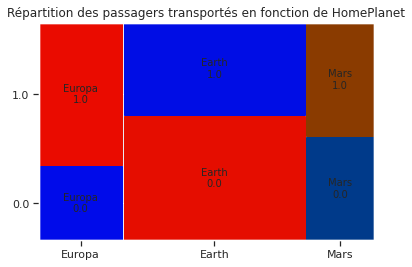

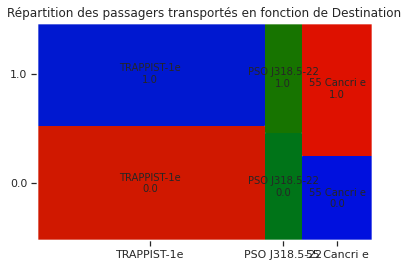

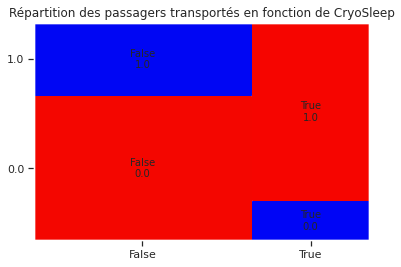

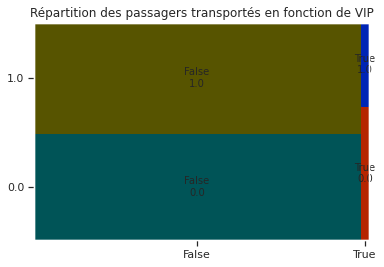

In [26]:
graphs = [mosaic(dataset, [var, "Transported"], 
                 title=f"Répartition des passagers transportés en fonction de {var}", statistic=True) for var in categorical_variables]

Plus les cases sont rouges, plus il y a de chances que les deux variables étudiées ne soient pas indépendantes.

On observe alors que toutes les variables ont des modalités permettent bien d'expliquer la probabilité d'être transporté dans une autre dimension ou non.

### Variables quantitatives

In [50]:
quantitative_variables = ['Age',
       'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

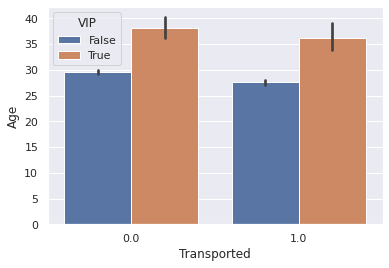

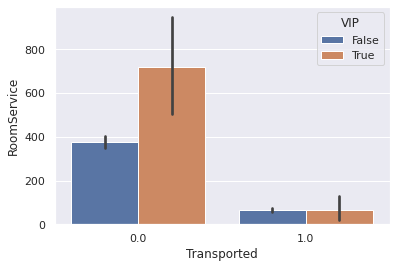

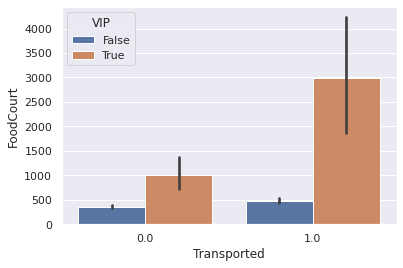

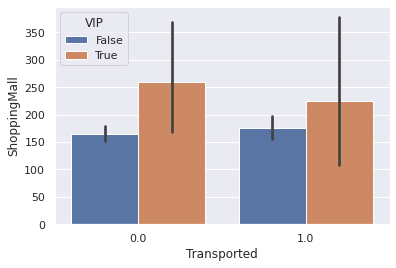

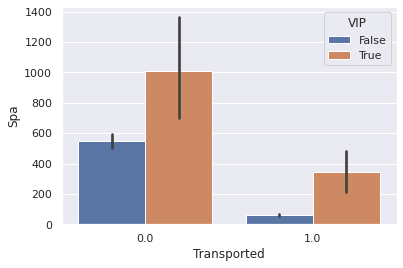

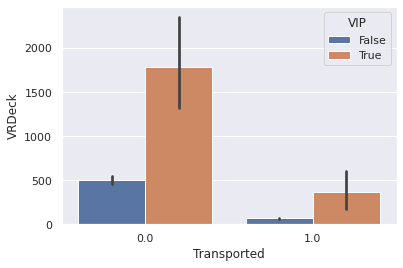

In [67]:
for var in quantitative_variables:
    plt.figure()
    sns.barplot(data=dataset, y=var, hue="VIP", x="Transported")

### Feature engineering

Essayons de créer de nouvelles variables à partir de `Name` et `Cabin`

In [ ]:
def create_cabin_variables(dataset):

  dataset["CabinDeck"] = dataset["Cabin"].apply(lambda x: x.split('/')[0])
  dataset["CabinNumero"] = dataset["Cabin"].apply(lambda x: x.split('/')[1])
  dataset["CabinSide"] = dataset["Cabin"].apply(lambda x: x.split('/')[2])

create_cabin_variables()

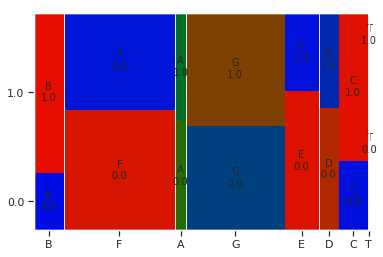

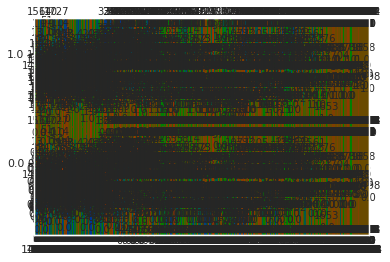

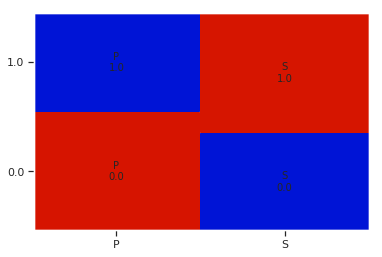

In [80]:
new_variables = ["CabinDeck", "CabinNumero", "CabinSide"]
graphs = [mosaic(dataset, [var, "Transported"], statistic=True) for var in new_variables]

On voit que le `Deck` et le `Side` de `Cabin` possède des modalités à même de discriminer les passagers transportés ou non !

La variable `CabinNumero` ayant beaucoup trop de modalités, on la retire ainsi que `Cabin`.

In [19]:
dataset = dataset.drop(["CabinNumero", "Cabin"], axis=1)

In [82]:
dataset["Name"]

0         Maham Ofracculy
1            Juanna Vines
2           Altark Susent
3            Solam Susent
4       Willy Santantines
              ...        
8688    Gravior Noxnuther
8689      Kurta Mondalley
8690         Fayey Connon
8691     Celeon Hontichre
8692     Propsh Hontichre
Name: Name, Length: 8693, dtype: object

On observe que certains passagers ont le même nom de famille. Est-ce qu'être de la même fraterie changerait la probabilité de survivre ?

In [ ]:
def create_have_siblings_column(dataset):

  previous_passenger = dataset.loc[0, "Name"]
  have_siblings = ["No"]
  for index,passenger in enumerate(dataset["Name"][1:]):
    if passenger.split(' ')[1] == previous_passenger.split(' ')[1]:
      print()
      have_siblings[index] = "Yes"
      have_siblings.append("Yes")
    else:
      have_siblings.append("No")

    previous_passenger = passenger

  dataset["HaveSiblings"] = have_siblings

create_have_siblings_column(dataset)

(<Figure size 432x288 with 3 Axes>,
 OrderedDict([(('0', '0.0'),
               (0.0, 0.0, 0.00011389612445657312, 0.9966777408637874)),
              (('0', '1.0'), (0.0, 1.0, 0.00011389612445657312, 0.0)),
              (('No', '0.0'),
               (0.005064391173961524,
                0.0,
                0.6201643976660406,
                0.5324766846965578)),
              (('No', '1.0'),
               (0.005064391173961524,
                0.5357989438327704,
                0.6201643976660406,
                0.46420105616722945)),
              (('Yes', '0.0'),
               (0.6301792838895071,
                0.0,
                0.36982071611049294,
                0.43126954909566406)),
              (('Yes', '1.0'),
               (0.6301792838895071,
                0.4345918082318767,
                0.36982071611049294,
                0.5654081917681233))]))

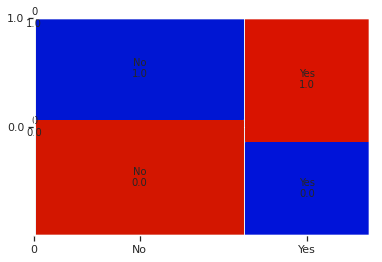

In [102]:
mosaic(dataset, ["HaveSiblings", "Transported"], statistic=True)

Avoir de la fraterie permet donc bien de discriminer légèrement les survivants !

Le nombre de parents présent l'augmenterait-il également ?

In [138]:
nb_siblings = dataset["Name"].apply(lambda x: x.split(' ')[1]).value_counts() - 1

for index, name in enumerate(dataset["Name"]):
  for other_name in nb_siblings.index:
    if name.split(' ')[1] == other_name:
      dataset.loc[index, "NbSiblings"] = nb_siblings[other_name]


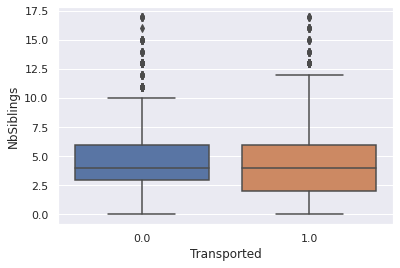

In [140]:
sns.boxplot(data=dataset, y="NbSiblings", x="Transported")

Le résultat est peu concluant.

On ne retiendra donc que la variable `HaveSiblings`.

In [98]:
dataset.drop(["NbSiblings", "Name"], axis=1, inplace=True)

In [144]:
dataset.columns

Index(['HomePlanet', 'CryoSleep', 'Destination', 'Age', 'VIP', 'RoomService',
       'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Name', 'Transported',
       'CabinDeck', 'CabinSide', 'HaveSiblings'],
      dtype='object')

## Modélisation

Pour ce projet nous utilisons PyCaret, une librarie permettant de lancer plusieurs modèles beaucoup plus facilement que scikit-learn ainsi que d'appliquer plusieurs opérations de préprocessing auparavant (normalisation, retrait des outliers, transformation non linéaire des données...).

In [111]:
exp_reg101 = setup(
                   data = dataset, 
                   target = 'Transported', 
                   session_id=0,
                   fold_shuffle=True,
                   fold=3,
                   transformation=True,
                   ) 

,Description,Value
0,session_id,0
1,Target,Transported
2,Target Type,Binary
3,Label Encoded,"0.0: 0, 1.0: 1"
4,Original Data,"(8693, 14)"
5,Missing Values,False
6,Numeric Features,6
7,Categorical Features,7
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [112]:
best_models = compare_models(include=["lr", "rf", "dt", "nb", "lightgbm"], n_select=3, turbo=True)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8012,0.8836,0.8145,0.7971,0.8054,0.6022,0.6028,0.1767
rf,Random Forest Classifier,0.7813,0.8551,0.7380,0.8119,0.7731,0.5629,0.5654,0.9100
lr,Logistic Regression,0.7571,0.8272,0.7407,0.7696,0.7549,0.5144,0.5147,0.1033
dt,Decision Tree Classifier,0.7310,0.7451,0.7345,0.7336,0.7338,0.4619,0.4621,0.0467
nb,Naive Bayes,0.6707,0.7862,0.7947,0.6695,0.7122,0.3390,0.3637,0.0333


In [113]:
vanilla_lightgbm = best_models[0]

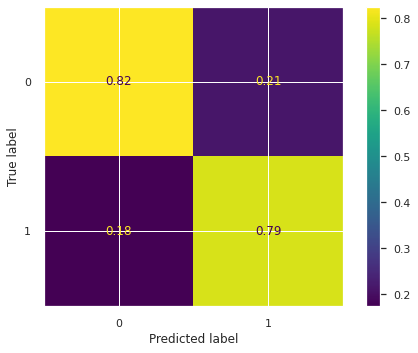

In [114]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

X_test= get_config("X_test")
y_test= get_config("y_test")
y_test_pred = vanilla_lightgbm.predict(X_test)

plot_confusion_matrix(vanilla_lightgbm, X_test, y_test, normalize="pred")

In [115]:
predictions = pd.concat([y_test, pd.Series(y_test_pred, index=y_test.index, name="Transported_pred")], axis=1)
predictions["wrong"] = predictions["Transported"] - predictions["Transported_pred"]

wrong_predictions = predictions[predictions["wrong"] == 1]

In [116]:
wrong_predictions = X_test.filter(items=wrong_predictions.index, axis=0)

In [118]:
grid = {
    "num_leaves": np.arange(20, 3000, 20).tolist()
    }
tuned_lightgbm = tune_model(vanilla_lightgbm, n_iter=1000, custom_grid=grid, search_library="tune-sklearn", early_stopping=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7945,0.8836,0.8380,0.7739,0.8047,0.5886,0.5906
1,0.8047,0.8862,0.8223,0.7973,0.8096,0.6093,0.6096
2,0.8072,0.8892,0.8057,0.8112,0.8084,0.6144,0.6144
Mean,0.8021,0.8863,0.8220,0.7941,0.8076,0.6041,0.6049
Std,0.0055,0.0023,0.0132,0.0154,0.0021,0.0112,0.0103


In [123]:
grid = {
    "num_leaves": [20],
    "max_depth": np.arange(3,12,1).tolist()
    }
tuned_lightgbm = tune_model(vanilla_lightgbm, n_iter=1000, custom_grid=grid, search_library="tune-sklearn", search_algorithm="grid", early_stopping=True, return_train_score=True)

Accuracy     AUC  Recall   Prec.      F1   Kappa     MCC
Split    Fold                                                          
CV-Train 0       0.8646  0.9503  0.8882  0.8504  0.8689  0.7291  0.7299
         1       0.8561  0.9459  0.8838  0.8396  0.8612  0.7119  0.7129
         2       0.8644  0.9492  0.8770  0.8578  0.8673  0.7288  0.7290
CV-Val   0       0.7989  0.8865  0.8439  0.7772  0.8092  0.5974  0.5997
         1       0.8092  0.8883  0.8213  0.8048  0.8130  0.6182  0.6184
         2       0.8072  0.8895  0.8076  0.8100  0.8088  0.6144  0.6144
CV-Train Mean    0.8617  0.9485  0.8830  0.8492  0.8658  0.7233  0.7239
         Std     0.0040  0.0019  0.0046  0.0075  0.0033  0.0080  0.0078
CV-Val   Mean    0.8051  0.8881  0.8243  0.7973  0.8103  0.6100  0.6108
         Std     0.0044  0.0012  0.0150  0.0144  0.0019  0.0090  0.0080
Train    NaN     0.8501  0.9374  0.8741  0.8365  0.8549  0.7001  0.7008

In [122]:
tuned_lightgbm

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=8,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=20, objective=None,
               random_state=0, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [125]:
tuned_lightgbm.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 20,
 'objective': None,
 'random_state': 0,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [ ]:
tuned_lightgbm = tune_model(lightgbm, search_library="tune-sklearn", search_algorithm="random", early_stopping=True, n_iter=100)

## Mise en production

Crééons le fichier de soumission

In [167]:
submission_file = pd.read_csv("/content/test.csv", index_col="PassengerId")
index = submission_file.index

### Preprocessing

#### Valeurs manquantes

In [168]:
boolean_variables = ["CryoSleep", "VIP"]

for var in boolean_variables:
  submission_file[var] = ["-1" if pd.isna(x) else ("True" if x else "False") for x in submission_file[var]]

categorical_variables = ['HomePlanet', 'Cabin', 'Destination', 'Name']
categorical_variables.extend(boolean_variables)

submission_file.fillna("-1", inplace=True)

ordinal_encoder = OrdinalEncoder(dtype=int)

submission_file[categorical_variables] = ordinal_encoder.fit_transform(submission_file[categorical_variables])

for column in categorical_variables:
  submission_file[column] = submission_file[column].apply(lambda x: -1 if x==0 else x)

#### Imputation

In [169]:
submission_file = pd.DataFrame(KNNImputer(missing_values=-1).fit_transform(X=submission_file), columns=submission_file.columns)

In [170]:
submission_file[categorical_variables] = ordinal_encoder.inverse_transform(submission_file[categorical_variables])

#### Feature Engineering

In [ ]:
create_cabin_variables(submission_file)
create_have_siblings_column(submission_file)

In [172]:
submission_file.drop("Name", axis=1, inplace=True)

### Prédiction

In [173]:
lightgbm_pipeline = get_config("prep_pipe")

final_predictions = tuned_lightgbm.predict(lightgbm_pipeline.transform(submission_file))

### "Mise en production"

Envoi vers le site de Kaggle

In [184]:
submission_file = pd.DataFrame(np.array([index,[True if x==1 else False for x in final_predictions]]), index=["PassengerId", "Transported"] ).T

In [186]:
submission_file.to_csv("submission_file.csv", index=False)

In [187]:
!kaggle competitions submit -c spaceship-titanic -f submission_file.csv -m "First submission"

100% 56.3k/56.3k [00:00<00:00, 280kB/s]
Successfully submitted to Spaceship Titanic

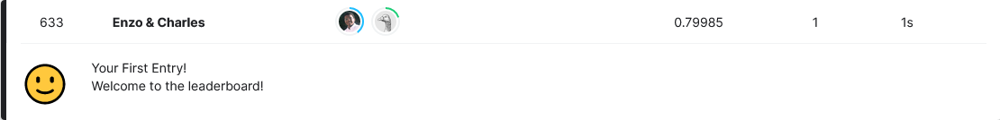